In [ ]:
from tensorflow import keras
from keras.utils.image_utils import load_img
from keras.utils.image_utils import img_to_array
from keras.applications.vgg16 import preprocess_input

In [ ]:
from torchvision.datasets import INaturalist

In [ ]:
#https://towardsdatascience.com/how-to-cluster-images-based-on-visual-similarity-cd6e7209fe34

In [ ]:
# models
from keras.applications.vgg16 import VGG16
from keras.models import Model

In [ ]:
# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
# for everything else
import os
import numpy as np
import matplotlib.pyplot as plt
from random import randint
import pandas as pd
import pickle

In [ ]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive

Mounted at /gdrive
/gdrive


In [ ]:
image_files =[]

In [ ]:
img_path = "/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/"
#img_path = "/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Train/Bovidae/"

In [ ]:
import os

def traverseDir(folderPath):

    for subFolderRoot, foldersWithinSubFolder, files in os.walk(folderPath, topdown=False):

        for fileName in files:
            print(os.path.join(subFolderRoot, fileName))
            if "Chordata" in os.path.join(subFolderRoot, fileName):
              image_files.append (os.path.join(subFolderRoot, fileName))

        for folderNameWithinSubFolder in foldersWithinSubFolder:
            print(os.path.join(subFolderRoot, folderNameWithinSubFolder))


traverseDir(img_path)

Streaming output truncated to the last 5000 lines.
/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/07255_Plantae_Tracheophyta_Magnoliopsida_Brassicales_Brassicaceae_Lepidium_campestre
/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/02041_Animalia_Arthropoda_Insecta_Lepidoptera_Papilionidae_Parnassius_smintheus
/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/01715_Animalia_Arthropoda_Insecta_Lepidoptera_Noctuidae_Thysanoplusia_orichalcea
/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/00922_Animalia_Arthropoda_Insecta_Lepidoptera_Crambidae_Parapoynx_maculalis
/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/05641_Fungi_Basidiomycota_Agaricomycetes_Phallales_Phallaceae_Aseroe_rubra
/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/01875_Animalia_Arthropoda_Insecta_Lepidoptera_Nymphali

In [ ]:
flowers = [[f.strip(f.split('/')[-1]),f.split('/')[-1]] for f in  image_files if ".jpg" in f]

In [ ]:
len (flowers)

24160

In [ ]:
flowers [:2]

[['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/03966_Animalia_Chordata_Aves_Passeriformes_Motacillidae_Macronyx_croceus/',
  '7c3311ac-2c73-46a1-96e2-ce9d39b2fc99.jpg'],
 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/03966_Animalia_Chordata_Aves_Passeriformes_Motacillidae_Macronyx_croceus/',
  'e9adec87-8243-440d-a695-dde1128bf6f6.jpg']]

In [ ]:
flowers [0] [0] + flowers [0] [1]

'/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/03966_Animalia_Chordata_Aves_Passeriformes_Motacillidae_Macronyx_croceus/7c3311ac-2c73-46a1-96e2-ce9d39b2fc99.jpg'

In [ ]:
flowers [0] [0] in done_files

NameError: ignored

In [ ]:
out_path = "/gdrive/MyDrive/Colab Notebooks/ComputerVision/ImageClustering/hardtoclassify/hardtoclassify_animals_4.csv"
read_df = pd.read_csv(out_path,names =["files","model","features"])
read_df.columns
done_files = read_df ["files"].values.tolist()

In [ ]:
len (done_files)

51751

In [ ]:
read_df ["species"] = read_df ["files"].apply (lambda x : x.split("/") [-3].split ("_") [2])
read_df

,files,model,features,species
0,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[0.0, 0.0, 0.7469325065612793, 0.0, 0.64493680...",Annelida
1,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[0.0, 0.0, 0.07706683874130249, 0.0, 0.9010466...",Annelida
2,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.7894616127014...",Annelida
3,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[0.0, 0.07317423820495605, 1.800889492034912, ...",Annelida
4,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[0.0, 0.2385675609111786, 0.0, 0.0, 0.51158469...",Annelida
...,...,...,...,...
51746,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[0.0, 0.0, 0.06371617317199707, 0.0, 0.0, 0.61...",Chordata
51747,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[0.0, 0.0, 0.0, 0.03593030571937561, 1.3808867...",Chordata
51748,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[0.0, 0.0, 0.0, 0.47661247849464417, 4.2638673...",Chordata
51749,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[0.0, 0.0, 0.0, 0.0, 1.60609769821167, 1.56698...",Chordata


In [ ]:
read_df.groupby("species").agg ("count")

,files,model,features
species,,,
Annelida,80,80,80
Arthropoda,30456,30456,30456
Chordata,21215,21215,21215


In [ ]:
done_files [:2]

['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/00000_Animalia_Annelida_Clitellata_Haplotaxida_Lumbricidae_Lumbricus_terrestris//05a8d8c4-73cf-4afd-afd3-c10453d8513d.jpg',
 '/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/00000_Animalia_Annelida_Clitellata_Haplotaxida_Lumbricidae_Lumbricus_terrestris//0ac885e9-fa6e-42f4-aa95-d229793ec475.jpg']

In [ ]:
[i [0] + '/' +i[1] for i in flowers] [0]

'/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/02314_Animalia_Arthropoda_Insecta_Odonata_Aeshnidae_Aeshna_tuberculifera//b24713e4-1c4c-4f47-9cec-3a1714a1b169.jpg'

In [ ]:
[i [0] + '/' +i[1] for i in flowers] [0] in done_files

False

In [ ]:
flowers = [i for i in flowers if i [0] + "/"+ i[1] not in done_files]

In [ ]:
len (flowers)

2945

In [ ]:
import random
flowers      = random.sample(flowers, 53950)

In [ ]:
flowers [-1]

In [ ]:
dir_blur = os.listdir("/gdrive/MyDrive/Colab Notebooks/ComputerVision/ImageClustering/blurry_dogs/")
dir_blur = list (set ([i for i in dir_blur if "blur" in i]))

In [ ]:
dir_blur

In [ ]:
len (dir_blur)

In [ ]:
for i in range (1):
  with os.scandir("/gdrive/MyDrive/Colab Notebooks/ComputerVision/ImageClustering/blurry_dogs/") as files:

    # loops through each file in the directory
      for file in files:
            if file.name.startswith('blur'):
            # adds only the image files to the flowers list
              f_path = "/gdrive/MyDrive/Colab Notebooks/ComputerVision/ImageClustering/blurry_dogs"
              flowers.append([f_path,file.name])

In [ ]:
flowers [0]

['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/02314_Animalia_Arthropoda_Insecta_Odonata_Aeshnidae_Aeshna_tuberculifera/',
 'b24713e4-1c4c-4f47-9cec-3a1714a1b169.jpg']

In [ ]:
flowers [-1]

['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/03305_Animalia_Chordata_Aves_Caprimulgiformes_Trochilidae_Anthracothorax_prevostii/',
 '83268395-4260-443d-b160-9ad85092b908.jpg']

In [ ]:
flowers [-17:-1]

[['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/00831_Animalia_Arthropoda_Insecta_Hymenoptera_Vespidae_Polistes_dorsalis/',
  '148cc17d-cca9-447f-9029-6a2b05c0ba6b.jpg'],
 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/00831_Animalia_Arthropoda_Insecta_Hymenoptera_Vespidae_Polistes_dorsalis/',
  '39433ce7-4beb-4fef-89df-3c4207c1f68b.jpg'],
 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/00831_Animalia_Arthropoda_Insecta_Hymenoptera_Vespidae_Polistes_dorsalis/',
  'b0688974-ccbb-4fcb-a08b-8aa3f7b553b2.jpg'],
 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/00831_Animalia_Arthropoda_Insecta_Hymenoptera_Vespidae_Polistes_dorsalis/',
  '5fa97936-7629-4454-bdf7-dd08750f8348.jpg'],
 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/00831_Animalia_Arthropoda_Insecta_Hymenoptera_Vespidae_Polistes_dorsalis/',
  

In [ ]:
len (flowers)

24160

In [ ]:
img = load_img(flowers [-1] [0] +"/"+ flowers [-1] [1], target_size=(224,224))
# convert from 'PIL.Image.Image' to numpy array
img = np.array(img)

print(img.shape)

(224, 224, 3)


In [ ]:
reshaped_img = img.reshape(1,224,224,3)
print(reshaped_img.shape)

(1, 224, 224, 3)


In [ ]:
x = preprocess_input(reshaped_img)

In [ ]:
# load model
model = VGG16()
# remove the output layer
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)

553467096/553467096 [==============================] - 24s 0us/step


In [ ]:
features = model.predict(reshaped_img)
print(features.shape)

1/1 [==============================] - 8s 8s/step
(1, 4096)


In [ ]:
# load the model first and pass as an argument
model = VGG16()
model = Model(inputs = model.inputs, outputs = model.layers[-2].output)

def extract_features(file, model):
    # load the image as a 224x224 array
    img = load_img(file, target_size=(224,224))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img)
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,224,224,3)
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    return features

In [ ]:
extract_features(flowers [0] [0] +"/"+ flowers [0] [1],model)

1/1 [==============================] - 0s 146ms/step


array([[0.       , 0.       , 0.8985472, ..., 0.       , 0.3315391,
        0.       ]], dtype=float32)

In [ ]:
extract_features(flowers [-1] [0] +"/"+ flowers [-1] [1],model)

1/1 [==============================] - 0s 20ms/step


array([[0.       , 0.       , 0.3657913, ..., 0.       , 1.1354647,
        0.       ]], dtype=float32)

In [ ]:
flowers_r_df = pd.DataFrame (flowers)
flowers_r_df ["file"] = flowers_r_df [0] + "/" + flowers_r_df[1]
flowers_r_df = flowers_r_df.drop ([0,1],axis = 1)
flowers_r_df ["model"] = model
flowers_r_df

,file,model
0,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...
1,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...
2,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...
3,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...
4,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...
...,...,...
24155,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...
24156,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...
24157,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...
24158,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...


In [ ]:
flowers_r_df.iloc [0,0]

'/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClustering/animals/2021_valid/02314_Animalia_Arthropoda_Insecta_Odonata_Aeshnidae_Aeshna_tuberculifera//b24713e4-1c4c-4f47-9cec-3a1714a1b169.jpg'

In [ ]:
flowers_r_df.iloc [0,1]

In [ ]:
extract_features(flowers_r_df.iloc [0,0],model)

1/1 [==============================] - 0s 37ms/step


array([[3.0100737 , 2.2769113 , 0.        , ..., 0.        , 0.15016347,
        1.6202033 ]], dtype=float32)

In [ ]:
extract_features(flowers_r_df.iloc [0,0],flowers_r_df.iloc [0,1])

1/1 [==============================] - 0s 28ms/step


array([[3.0100737 , 2.2769113 , 0.        , ..., 0.        , 0.15016347,
        1.6202033 ]], dtype=float32)

In [ ]:
flowers_r_df.columns

Index(['file', 'model'], dtype='object')

In [ ]:
flowers_r_df.head()

,file,model
0,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...
1,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...
2,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...
3,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...
4,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...


In [ ]:
#flowers_r_df ['features'] = flowers_r_df.apply (lambda x : extract_features (x.file , x.model) ,axis =1)

1/1 [==============================] - 0s 104ms/step


KeyboardInterrupt: ignored

In [ ]:
flowers_r_df

,file,model,features
0,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[[0.4532972, 0.0, 2.2353897, 0.0, 0.0, 0.0, 0...."
1,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[[0.0, 0.0, 1.0283906, 0.0, 4.7916837, 0.0, 0...."
2,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[[0.0, 0.0, 1.2911763, 1.8901607, 0.0, 2.69456..."
3,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[[0.0, 0.0, 3.0399265, 3.5344887, 0.62662685, ..."
4,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[[0.0, 0.0, 0.2473656, 1.308809, 0.0, 1.570016..."
...,...,...,...
115,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[[0.060364366, 0.0, 0.32989123, 0.0, 0.0, 0.0,..."
116,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[[0.0, 1.4503587, 2.3219504, 0.0, 4.1180634, 0..."
117,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[[0.0, 0.0, 0.0, 0.0, 2.8597708, 0.0, 0.279195..."
118,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[[0.35790205, 0.0, 0.0, 0.0, 0.0, 0.4786176, 0..."


In [ ]:
flowers_r_df.iloc[0,-1]

In [ ]:
flowers_r_df.iloc[0,-1].tolist() [0]

[0.4532971978187561,
 0.0,
 2.2353897094726562,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 3.920588254928589,
 0.0,
 0.0,
 0.0,
 0.0,
 0.8352367877960205,
 0.0,
 0.0,
 1.3628864288330078,
 0.0,
 0.0,
 0.0,
 0.0,
 0.19000622630119324,
 1.5835261344909668,
 2.2413504123687744,
 0.0,
 2.325417995452881,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.4047691822052002,
 0.0,
 1.0693285465240479,
 0.0,
 0.0,
 0.9686623215675354,
 0.0,
 0.0,
 0.0,
 0.0,
 2.5802812576293945,
 0.0,
 2.5119056701660156,
 1.406214714050293,
 0.0,
 0.0,
 2.636439561843872,
 0.0,
 0.7606490850448608,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.4855811595916748,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 1.0892378091812134,
 0.0,
 0.0,
 0.0,
 0.4016677141189575,
 0.0,
 0.23248322308063507,
 0.0,
 2.939523935317993,
 1.3400874137878418,
 0.0,
 0.0,
 3.03707218170166,
 0.9256967306137085,
 1.046112298965454,
 0.49866604804992676,
 1.2053155899047852,
 0.0,
 0.2729323208332062,
 1.9276704788208008,
 0.462766498327

In [ ]:
flowers_r_df ["features"] = flowers_r_df ["features"].apply (lambda x : x.tolist() [0])

In [ ]:
out_path = "/gdrive/MyDrive/Colab Notebooks/ComputerVision/ImageClustering/hardtoclassify/hardtoclassify_animals_2.csv"

#https://stackoverflow.com/questions/48250995/write-lists-to-pandas-dataframe-to-csv-read-dataframe-from-csv-and-convert-to-l
import ast

l1 = [('a','b'), ('c','d')]
l2 = [('e','f'), ('g','h')]
L = [l1,l2]

df = pd.DataFrame(L)
print (df)
        0       1
0  (a, b)  (c, d)
1  (e, f)  (g, h)

df.to_csv('MyLists.csv', sep=";")

readdf = pd.read_csv('MyLists.csv', delimiter = ";", index_col=0)
newList = readdf.applymap(ast.literal_eval).values.tolist()
print (newList)
[[('a', 'b'), ('c', 'd')], [('e', 'f'), ('g', 'h')]]

In [ ]:
flowers_r_df.to_csv(out_path, sep=";")

In [ ]:
flowers_read_df = pd.read_csv(out_path, delimiter = ";", index_col=0)

In [ ]:
flowers_read_df

,file,model,features
0,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[0.4532971978187561, 0.0, 2.2353897094726562, ..."
1,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[0.0, 0.0, 1.028390645980835, 0.0, 4.791683673..."
2,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[0.0, 0.0, 1.2911763191223145, 1.8901606798171..."
3,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[0.0, 0.0, 3.039926528930664, 3.53448867797851..."
4,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[0.0, 0.0, 0.24736559391021729, 1.308809041976..."
...,...,...,...
115,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[0.060364365577697754, 0.0, 0.3298912346363067..."
116,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[0.0, 1.4503587484359741, 2.3219504356384277, ..."
117,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[0.0, 0.0, 0.0, 0.0, 2.8597707748413086, 0.0, ..."
118,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,<keras.engine.functional.Functional object at ...,"[0.35790205001831055, 0.0, 0.0, 0.0, 0.0, 0.47..."


In [ ]:
counter = 0

In [ ]:
def extract_features_df (df):
    try:
      global counter
      counter = counter + 1
      #print (df)
      print (counter)
      #print (df ["file"])

      # load the image as a 224x224 array
      img = load_img(df ["file"].values [0], target_size=(224,224))

      # convert from 'PIL.Image.Image' to numpy array
      img = np.array(img)

      # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
      reshaped_img = img.reshape(1,224,224,3)

      # prepare image for model
      imgx = preprocess_input(reshaped_img)

      # get the feature vector

      features = model.predict(imgx, use_multiprocessing=True)

      df ["features"] = [features.tolist()[0]]


      df.to_csv ("/gdrive/MyDrive/Colab Notebooks/ComputerVision/ImageClustering/hardtoclassify/hardtoclassify_animals_4.csv",mode='a',index=False,header=False)
    except :
      print ("error")
      pass
    return df

In [ ]:
apply_df = flowers_r_df.groupby ("file").apply (extract_features_df)

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 26ms/step
18717
1/1 [==============================] - 0s 21ms/step
18718
1/1 [==============================] - 0s 24ms/step
18719
1/1 [==============================] - 0s 24ms/step
18720
1/1 [==============================] - 0s 22ms/step
18721
1/1 [==============================] - 0s 27ms/step
18722
1/1 [==============================] - 0s 24ms/step
18723
1/1 [==============================] - 0s 22ms/step
18724
1/1 [==============================] - 0s 28ms/step
18725
1/1 [==============================] - 0s 33ms/step
18726
1/1 [==============================] - 0s 38ms/step
18727
1/1 [==============================] - 0s 30ms/step
18728
1/1 [==============================] - 0s 22ms/step
18729
1/1 [==============================] - 0s 21ms/step
18730
1/1 [==============================] - 0s 22ms/step
18731
1/1 [==============================] - 0s 22ms/step
18732
1/1 [================

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
apply_df_path = "/gdrive/MyDrive/Colab Notebooks/ComputerVision/ImageClustering/hardtoclassify/hardtoclassify_animals_4.csv"

In [ ]:
apply_df = pd.read_csv (apply_df_path,header=None,names = ['file', 'model', 'features']).drop('model',axis=1)
apply_df

,file,features
0,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,"[0.0, 0.0, 0.7469325065612793, 0.0, 0.64493680..."
1,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,"[0.0, 0.0, 0.07706683874130249, 0.0, 0.9010466..."
2,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.7894616127014..."
3,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,"[0.0, 0.07317423820495605, 1.800889492034912, ..."
4,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,"[0.0, 0.2385675609111786, 0.0, 0.0, 0.51158469..."
...,...,...
51746,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,"[0.0, 0.0, 0.06371617317199707, 0.0, 0.0, 0.61..."
51747,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,"[0.0, 0.0, 0.0, 0.03593030571937561, 1.3808867..."
51748,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,"[0.0, 0.0, 0.0, 0.47661247849464417, 4.2638673..."
51749,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,"[0.0, 0.0, 0.0, 0.0, 1.60609769821167, 1.56698..."


In [ ]:
apply_df ["species"] = apply_df ["file"].apply (lambda x : x.split("/") [-3].split ("_") [2])
apply_df

,file,features,species
0,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,"[0.0, 0.0, 0.7469325065612793, 0.0, 0.64493680...",Annelida
1,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,"[0.0, 0.0, 0.07706683874130249, 0.0, 0.9010466...",Annelida
2,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.7894616127014...",Annelida
3,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,"[0.0, 0.07317423820495605, 1.800889492034912, ...",Annelida
4,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,"[0.0, 0.2385675609111786, 0.0, 0.0, 0.51158469...",Annelida
...,...,...,...
51746,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,"[0.0, 0.0, 0.06371617317199707, 0.0, 0.0, 0.61...",Chordata
51747,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,"[0.0, 0.0, 0.0, 0.03593030571937561, 1.3808867...",Chordata
51748,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,"[0.0, 0.0, 0.0, 0.47661247849464417, 4.2638673...",Chordata
51749,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,"[0.0, 0.0, 0.0, 0.0, 1.60609769821167, 1.56698...",Chordata


In [ ]:
c = apply_df ["species"] == "Chordata"

In [ ]:
apply_df = apply_df [c]

In [ ]:
#del (feat)

In [ ]:
#apply_df.drop

In [ ]:
apply_df.iloc [0,-1]

'Chordata'

In [ ]:
apply_df.columns

Index(['file', 'model', 'features', 'species'], dtype='object')

In [ ]:
apply_df ["features"] = apply_df ["features"].apply(lambda x : tuple (x) )
apply_df.iloc [0 ,-1]

('[',
 '[',
 '0',
 '.',
 ' ',
 ' ',
 ' ',
 ' ',
 ' ',
 ' ',
 ' ',
 ' ',
 '0',
 '.',
 ' ',
 ' ',
 ' ',
 ' ',
 ' ',
 ' ',
 ' ',
 ' ',
 '0',
 '.',
 ' ',
 ' ',
 ' ',
 ' ',
 ' ',
 ' ',
 ' ',
 ' ',
 '.',
 '.',
 '.',
 ' ',
 '0',
 '.',
 ' ',
 ' ',
 ' ',
 ' ',
 ' ',
 ' ',
 ' ',
 ' ',
 '0',
 '.',
 '8',
 '7',
 '8',
 '7',
 '6',
 '0',
 '1',
 ' ',
 '0',
 '.',
 ' ',
 ' ',
 ' ',
 ' ',
 ' ',
 ' ',
 ' ',
 ']',
 ']')

In [ ]:
flowers_read_df

NameError: ignored

In [ ]:
filenames = apply_df ["file"]

In [ ]:
filenames = flowers_read_df ["file"]

NameError: ignored

In [ ]:
# get a list of just the features
#feat = np.array(list(data.values()))
feat = np.array(list(apply_df ["features"].values))
feat.shape

(21215,)

In [ ]:
flowers_read_df ["features"].apply (lambda x : list (x) )

0      [[, 0, ., 4, 5, 3, 2, 9, 7, 1, 9, 7, 8, 1, 8, ...
1      [[, 0, ., 0, ,,  , 0, ., 0, ,,  , 1, ., 0, 2, ...
2      [[, 0, ., 0, ,,  , 0, ., 0, ,,  , 1, ., 2, 9, ...
3      [[, 0, ., 0, ,,  , 0, ., 0, ,,  , 3, ., 0, 3, ...
4      [[, 0, ., 0, ,,  , 0, ., 0, ,,  , 0, ., 2, 4, ...
                             ...                        
115    [[, 0, ., 0, 6, 0, 3, 6, 4, 3, 6, 5, 5, 7, 7, ...
116    [[, 0, ., 0, ,,  , 1, ., 4, 5, 0, 3, 5, 8, 7, ...
117    [[, 0, ., 0, ,,  , 0, ., 0, ,,  , 0, ., 0, ,, ...
118    [[, 0, ., 3, 5, 7, 9, 0, 2, 0, 5, 0, 0, 1, 8, ...
119    [[, 0, ., 3, 6, 0, 0, 6, 9, 3, 9, 4, 1, 1, 1, ...
Name: features, Length: 120, dtype: object

In [ ]:
flowers_read_df ["features"].iloc [0].split(",") [0]

'[0.4532971978187561'

In [ ]:
float (flowers_read_df ["features"].iloc [0].split(",") [0] [1:])

0.4532971978187561

In [ ]:
float (flowers_read_df ["features"].iloc [0].split(",") [-1] [:-1])

0.0

In [ ]:
flowers_read_df ["features"].iloc [0].split(",") [-1]

' 0.0]'

In [ ]:
flowers_read_df ["features"].iloc [0].split(",") [1]

' 0.0'

In [ ]:
float (flowers_read_df ["features"].iloc [0].split(",") [1])

0.0

In [ ]:
[float (i) for i in flowers_read_df ["features"].iloc [0].split(",") [1:-2] ] [:10]

[0.0, 2.2353897094726562, 0.0, 0.0, 0.0, 0.0, 0.0, 3.920588254928589, 0.0, 0.0]

In [ ]:
def convert_string_to_float (feat_str):
    x =  feat_str.split(",")
    y = []
    y.append (float (x [0] [1:]))
    for i in x [1:-1]  : y.append ( float (i) )
    y.append ( float (x [-1] [:-1]) )
    return y


In [ ]:
flowers_read_df ["features"].iloc [0]

'[0.4532971978187561, 0.0, 2.2353897094726562, 0.0, 0.0, 0.0, 0.0, 0.0, 3.920588254928589, 0.0, 0.0, 0.0, 0.0, 0.8352367877960205, 0.0, 0.0, 1.3628864288330078, 0.0, 0.0, 0.0, 0.0, 0.19000622630119324, 1.5835261344909668, 2.2413504123687744, 0.0, 2.325417995452881, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4047691822052002, 0.0, 1.0693285465240479, 0.0, 0.0, 0.9686623215675354, 0.0, 0.0, 0.0, 0.0, 2.5802812576293945, 0.0, 2.5119056701660156, 1.406214714050293, 0.0, 0.0, 2.636439561843872, 0.0, 0.7606490850448608, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4855811595916748, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0892378091812134, 0.0, 0.0, 0.0, 0.4016677141189575, 0.0, 0.23248322308063507, 0.0, 2.939523935317993, 1.3400874137878418, 0.0, 0.0, 3.03707218170166, 0.9256967306137085, 1.046112298965454, 0.49866604804992676, 1.2053155899047852, 0.0, 0.2729323208332062, 1.9276704788208008, 0.46276649832725525, 2.9638617038726807, 0.0, 0.0, 1.5165395736694336, 1.9891798496246338, 1.3719334602

In [ ]:
convert_string_to_float (flowers_read_df ["features"].iloc [0]) [:10]

[0.4532971978187561,
 0.0,
 2.2353897094726562,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 3.920588254928589,
 0.0]

In [ ]:
convert_string_to_float (flowers_read_df ["features"].iloc [0]) [:10]

In [ ]:
convert_string_to_float (apply_df ["features"].iloc [0]) [-10:]

[1.1277904510498047,
 1.17728853225708,
 4.61823844909668,
 1.8768134117126465,
 1.9921233654022217,
 0.0,
 0.0,
 0.0,
 0.8787600994110107,
 0.0]

In [ ]:
len (convert_string_to_float (flowers_read_df ["features"].iloc [0]))

4096

In [ ]:
flowers_read_df ["features1"] = flowers_read_df ["features"].apply (lambda x : convert_string_to_float (x) )

In [ ]:
import numpy as np

In [ ]:
apply_df ["features1"] = apply_df ["features"].apply (lambda x : convert_string_to_float (x) )

<ipython-input-12-8e1dcd7f7a78>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  apply_df ["features1"] = apply_df ["features"].apply (lambda x : convert_string_to_float (x) )


In [ ]:
apply_df = apply_df.drop('features',axis=1)

In [ ]:
# get a list of just the features
#feat = np.array(list(data.values()))
feat = np.array(list(apply_df.features1.values))
feat.shape

(21215, 4096)

In [ ]:
# reshape so that there are 210 samples of 4096 vectors
feat = feat.reshape(-1,4096)
feat.shape

(21215, 4096)

In [ ]:
pca = PCA(n_components=50, random_state=22)
pca.fit(feat)
x = pca.transform(feat)

In [ ]:
#del (apply_df)

In [ ]:
#del (feat)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: F

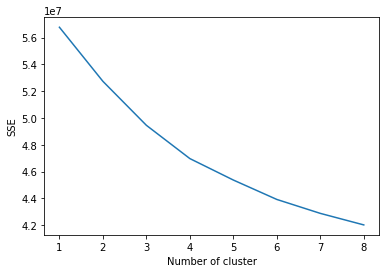

In [ ]:
sse = {}
for k in range(1, 9):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(x)
    #data["clusters"] = kmeans.labels_
    #print(data["clusters"])
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

In [ ]:
kmeans = KMeans(n_clusters= 4, random_state=22)
kmeans.fit(x)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=4, random_state=22)

In [ ]:
!pip install k-means-constrained

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 22.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.3/16.3 MB 61.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.4/302.4 KB 28.5 MB/s eta 0:00:00
  Created wheel for k-means-constrained: filename=k_means_constrained-0.7.2-cp39-cp39-linux_x86_64.whl size=2003114 sha256=f0352c4fa8afde84a067f1d1ebc196e673798097ae2f95f165e7dec5c3689009
  Stored in directory: /root/.cache/pip/wheels/51/40/52/9e1bf6cea6d18c62a4dce6a797ebff6698094d1d3bdb0a0515
Successfully built k-means-constrained
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.19.6
    Uninstalling protobuf-3.19.6:
      Successfully uninstalled protobuf-3.19.6
ERROR: pip's dependency reso

In [ ]:
apply_df = apply_df.drop ("model",axis = 1)


In [ ]:
apply_df.columns

Index(['file', 'species', 'features1'], dtype='object')

In [ ]:
apply_df = apply_df.drop ("features",axis = 1)

In [ ]:
from k_means_constrained import KMeansConstrained

In [ ]:
#n_samples = 2000
n_clusters = 3
#X = np.random.rand(n_samples, 2)
model = minmax.MinMaxKMeansMinCostFlow(n_clusters, size_min=50,   size_max=800)
model.fit(x)
centers = model.cluster_centers_
labels = model.labels_

ImportError: ignored

In [ ]:
>>> from k_means_constrained import KMeansConstrained
>>> import numpy as np
>>> X = np.array([[1, 2], [1, 4], [1, 0],
...                [4, 2], [4, 4], [4, 0]])
>>> clf = KMeansConstrained(
...     n_clusters=2,
...     size_min=2,
...     size_max=5,
...     random_state=0
... )
>>> clf.fit_predict(X)
array([0, 0, 0, 1, 1, 1], dtype=int32)
>>> clf.cluster_centers_
array([[ 1.,  2.],
       [ 4.,  2.]])
>>> clf.labels_
array([0, 0, 0, 1, 1, 1], dtype=int32)

In [ ]:
len (x)

747

In [ ]:
747 / 40

18.675

In [ ]:
len (x)

20032

In [ ]:
len (x)/2000

10.016

In [ ]:
900 * 19

17100

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
#!pip install numpy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement numpy.core.multiarray (from versions: none)
ERROR: No matching distribution found for numpy.core.multiarray


In [ ]:
from k_means_constrained import KMeansConstrained

In [ ]:
from k_means_constrained import KMeansConstrained
kmeans = KMeansConstrained(n_clusters= 10, random_state=22 , size_min = 2000)
kmeans.fit(x)

KMeansConstrained(copy_x=True, init='k-means++', max_iter=300, n_clusters=10,
         n_init=10, n_jobs=1, random_state=22, size_max=None,
         size_min=2000, tol=0.0001, verbose=False)

In [ ]:
from k_means_constrained import KMeansConstrained
kmeans = KMeansConstrained(n_clusters= 6, random_state=22 , size_min = 40)
kmeans.fit(x)

ImportError: ignored

In [ ]:
from sklearn.datasets import load_iris
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import euclidean_distances

dists = euclidean_distances(kmeans.cluster_centers_)

import numpy as np
tri_dists = dists[np.triu_indices(2, 1)]
max_dist, avg_dist, min_dist = tri_dists.max(), tri_dists.mean(), tri_dists.min()
print (max_dist, avg_dist, min_dist)

48.719191828785654 48.719191828785654 48.719191828785654


In [ ]:
dists

array([[ 0.        , 55.64669255, 29.4709483 , 40.50633459, 36.50235744,
        32.16248817, 43.16045733, 47.69402051, 27.67860322, 56.18874257,
        58.20841513, 37.26822999, 42.19500563, 42.54850417, 60.31940218,
        43.99539217, 33.86353767, 52.36798322, 47.86144451],
       [55.64669255,  0.        , 49.90122387, 37.44471105, 47.25254073,
        58.8706285 , 35.90913809, 45.18142177, 54.15109767, 58.92095649,
        37.82386314, 47.23331451, 50.19504671, 40.93395445, 42.24019181,
        50.3482179 , 43.03839699, 50.15542079, 43.35855756],
       [29.4709483 , 49.90122387,  0.        , 39.84325961, 29.68291697,
        50.64993344, 36.42261779, 38.89913192, 36.7981205 , 61.6578064 ,
        52.76451281, 30.78437453, 27.87832116, 38.17320727, 56.67056561,
        36.46977588, 27.0723079 , 49.43183516, 40.33130225],
       [40.50633459, 37.44471105, 39.84325961,  0.        , 42.3042641 ,
        37.18979863, 39.83117545, 43.09555278, 37.8974521 , 55.28789591,
        42.702

In [ ]:
dists.tolist()

[[0.0,
  82.8523941040039,
  65.42290496826172,
  78.45658874511719,
  74.06504821777344,
  70.22239685058594,
  72.58189392089844,
  40.69840621948242,
  62.799625396728516,
  75.47183227539062,
  71.77690887451172,
  35.302940368652344,
  28.557714462280273,
  68.36425018310547,
  63.91035842895508,
  32.87065887451172,
  79.25772857666016,
  69.80984497070312],
 [82.8523941040039,
  0.0,
  60.80146026611328,
  45.93252944946289,
  42.2543830871582,
  46.92219543457031,
  52.823001861572266,
  66.47601318359375,
  52.593833923339844,
  23.847200393676758,
  43.11198043823242,
  64.22254943847656,
  79.73143768310547,
  47.749061584472656,
  56.49143981933594,
  77.23674011230469,
  45.6838493347168,
  37.661956787109375],
 [65.42290496826172,
  60.80146026611328,
  0.0,
  59.593570709228516,
  48.00056076049805,
  39.86637496948242,
  56.09307861328125,
  40.08017349243164,
  45.87378692626953,
  56.770355224609375,
  49.939476013183594,
  46.92585754394531,
  61.06501770019531,
  53

In [ ]:
dists.tolist() [0] [:0] + dists.tolist() [0][0+1 :]

[60.16529083251953,
 62.524330139160156,
 50.538055419921875,
 47.42853927612305,
 65.57158660888672]

In [ ]:
dists.tolist() [0]

In [ ]:
d_list = [d[:i] + d[i+1 :]   for d,i in zip (dists.tolist(),range (len(dists))) ]
d_list

[[48.719191828785654,
  45.13628099050022,
  30.073318803958472,
  44.66046199399584,
  29.3202586900289,
  36.533806257608276,
  27.337988511955018,
  39.18832185545498,
  45.00297715175401],
 [48.719191828785654,
  40.309780516015955,
  45.199048503672884,
  54.22043800820471,
  46.11459727015656,
  38.46573703301973,
  45.56304812769519,
  52.00977746492169,
  41.05558214340427],
 [45.13628099050022,
  40.309780516015955,
  49.851847091790205,
  50.54890945611772,
  36.908635253419924,
  47.37930707100638,
  34.22770020728491,
  47.25696762879663,
  53.11020877699783],
 [30.073318803958472,
  45.199048503672884,
  49.851847091790205,
  53.99538217149291,
  28.277779790439684,
  29.991216379507236,
  35.581314253351216,
  43.52929711944419,
  36.54522917262488],
 [44.66046199399584,
  54.22043800820471,
  50.54890945611772,
  53.99538217149291,
  51.796588735398934,
  40.656573851835645,
  35.85623107374688,
  40.41243263847897,
  45.70816611128231],
 [29.3202586900289,
  46.11459727

In [ ]:
[[np.mean(d),i] for d,i in zip (d_list,range (len(dists)))]

[[57.24556045532226, 0],
 [44.57106742858887, 1],
 [50.51621322631836, 2],
 [42.40848617553711, 3],
 [44.39225387573242, 4],
 [46.20092430114746, 5]]

In [ ]:
sorted([[np.mean(d),i] for d,i in zip (d_list,range (len(dists)))])

[[34.445416617706094, 7],
 [36.797975040384515, 6],
 [37.73808157666994, 5],
 [38.44140067600459, 0],
 [39.2271592540313, 3],
 [42.04044592331571, 8],
 [42.60062291800136, 9],
 [44.96995966576997, 2],
 [45.73968898843074, 1],
 [46.42835378228377, 4]]

In [ ]:
len(dists  [-1])

18

In [ ]:
[[np.mean (d),i] for d,i in zip (dists,range(len(dists))) ]

[[30.94895, 0], [35.319164, 1], [26.032646, 2]]

In [ ]:
sorted ([np.mean (d) for d in dists ])

[26.032646, 30.94895, 35.319164]

In [ ]:
sorted ([[np.mean (d),i] for d,i in zip (dists,range(len(dists))) ])

[[35.340405, 3],
 [36.993546, 4],
 [37.142555, 1],
 [38.50077, 5],
 [42.096844, 2],
 [47.704636, 0]]

In [ ]:
d1_list = [[d1] for d in dists for d1 in d if d1 != 0]
d1_list

[60.16529,
 62.52433,
 50.538055,
 47.42854,
 65.57159,
 60.16529,
 49.949455,
 33.130875,
 47.922386,
 31.68733,
 62.52433,
 49.949455,
 47.56601,
 45.62445,
 46.91682,
 50.538055,
 33.130875,
 47.56601,
 37.48225,
 43.32524,
 47.42854,
 47.922386,
 45.62445,
 37.48225,
 43.503643,
 65.57159,
 31.68733,
 46.91682,
 43.32524,
 43.503643]

In [ ]:
sorted ([[np.mean (d),i]  for d,i in zip (d1_list,range(len(d1_list))) ])

[[31.68733, 9],
 [31.68733, 26],
 [33.130875, 7],
 [33.130875, 16],
 [37.48225, 18],
 [37.48225, 23],
 [43.32524, 19],
 [43.32524, 28],
 [43.503643, 24],
 [43.503643, 29],
 [45.62445, 13],
 [45.62445, 22],
 [46.91682, 14],
 [46.91682, 27],
 [47.42854, 3],
 [47.42854, 20],
 [47.56601, 12],
 [47.56601, 17],
 [47.922386, 8],
 [47.922386, 21],
 [49.949455, 6],
 [49.949455, 11],
 [50.538055, 2],
 [50.538055, 15],
 [60.16529, 0],
 [60.16529, 5],
 [62.52433, 1],
 [62.52433, 10],
 [65.57159, 4],
 [65.57159, 25]]

In [ ]:
sorted ([[np.max (d),i] for d,i in zip (dists,range(len(dists))) ])

[[49.322988781079985, 0],
 [50.28789664634383, 5],
 [56.169963448212144, 1],
 [59.81818480202551, 4],
 [66.38929045474895, 2],
 [66.38929045474895, 3]]

In [ ]:
dists.shape

(3, 3)

In [ ]:
[np.triu_indices(3, 0)]

[(array([0, 0, 0, 1, 1, 2]), array([0, 1, 2, 1, 2, 2]))]

In [ ]:
tri_dists

array([45.089672, 51.02033 , 30.426308], dtype=float32)

In [ ]:
sorted(tri_dists)

[30.826832,
 35.082375,
 36.224472,
 38.08498,
 38.151276,
 38.28871,
 38.353195,
 38.5562,
 39.9762,
 40.84638,
 41.15756,
 41.957672,
 42.1083,
 43.656338,
 43.923313,
 45.036335,
 45.05356,
 45.13265,
 49.046703,
 50.085888,
 50.394066,
 51.036808,
 52.928345,
 54.898914,
 55.871914,
 57.239315,
 63.47099,
 65.05459]

In [ ]:
len (kmeans.cluster_centers_)

2

In [ ]:
kmeans.cluster_centers_[-1]

array([ 16.12855026, -11.62647327,   5.1648958 ,  -7.02436247,
       -18.02411509,  -2.98287107,  -6.08327953,  -3.2285409 ,
         0.62943738,   1.87083644,  -2.57608203,  -2.54929513,
        -0.29251363,   2.49257991,  -1.77788762,   2.34748424,
        -1.23957169,   0.74063702,  -0.29311557,  -1.73292067,
         0.3917848 ,  -1.67543827,  -0.61188732,  -0.30677547,
        -0.73102918,   0.31455945,  -1.25379542,  -1.27170363,
        -0.64595844,  -0.04688204,   1.03244027,   0.89207386,
         1.1752481 ,   0.27336481,  -0.98114627,   0.76789221,
        -1.12829832,  -1.1287303 ,   0.74136055,   0.81860297,
         0.29216591,  -0.38906859,   0.09050745,   0.0725767 ,
         0.19319325,  -0.14220156,   0.71976599,   1.17322341,
         0.88762655,   0.22154634])

In [ ]:
kmeans.predict(x)

array([0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1,
       0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0,
       0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0,
       0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1,
       0, 1], dtype=int32)

In [ ]:
kmeans.transform(x)

array([[ 66.45158675,  75.74097119,  28.70778386, ...,  67.35967914,
         84.36129054,  64.16443604],
       [ 55.00584491,  49.61161315,  65.19487768, ...,  57.00100023,
         61.48544989,  51.47122477],
       [ 67.57445078,  73.09324199,  77.3100175 , ...,  41.69238252,
         82.8333357 ,  62.51430731],
       ...,
       [ 73.40279827,  65.24455378, 100.2067611 , ...,  90.90405371,
         49.57877242,  85.60475867],
       [ 50.56323923,  44.11399147,  73.01654707, ...,  66.07749322,
         52.84802761,  52.99589909],
       [ 47.10992926,  43.9344428 ,  72.17887064, ...,  59.48199777,
         58.69846679,  49.04557812]])

In [ ]:
len (kmeans.transform(x))

200

In [ ]:
len (kmeans.transform(x) [-1])

2

In [ ]:
kmeans.transform(x) [-1]

array([57.723747, 35.005123], dtype=float32)

In [ ]:
len (kmeans.labels_)

21215

In [ ]:
kmeans.labels_ [-17:]

array([0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], dtype=int32)

In [ ]:
apply_df ["cluster"] = kmeans.labels_

In [ ]:
apply_df = apply_df.reset_index().drop('index',axis = 1)

In [ ]:
apply_df = apply_df .drop ([i for i in range (10)],axis = 1)

In [ ]:
apply_df

,file,species,features1,cluster
10,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 1.1878187656402588, 0.0, 0.0, 0.0, ...",0
11,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.8463890552520752, 0.0, 3.9840009212493...",2
12,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.0, 0.26870211958885193, 0.0,...",5
13,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 1.6730728149414062, 0.0, 0.46159198...",5
14,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.954376220703125, 1.8372515439987183, 0...",4
...,...,...,...,...
21210,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.06371617317199707, 0.0, 0.0, 0.61...",0
21211,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.03593030571937561, 1.3808867...",2
21212,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.47661247849464417, 4.2638673...",0
21213,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.0, 1.60609769821167, 1.56698...",0


In [ ]:
pd.DataFrame (kmeans.transform(x))

,0,1,2,3,4,5,6,7,8,9
0,59.453012,65.886010,48.994703,61.063413,65.289968,46.183314,69.066647,61.141884,63.560047,73.299983
1,52.741152,69.535279,53.584332,66.033009,63.733118,48.772238,72.816171,58.389104,69.828790,74.969575
2,58.419576,68.627049,50.005173,59.956624,63.175502,46.277509,73.448018,57.900893,67.876780,76.216872
3,50.183993,68.530715,57.988711,67.421583,65.603875,60.607851,70.766389,60.598783,67.203688,74.064147
4,51.479586,61.701348,47.668398,58.022981,60.949938,44.100127,63.621738,56.799320,60.025340,67.014285
...,...,...,...,...,...,...,...,...,...,...
21210,64.805392,83.567827,77.591465,87.305394,82.671815,81.443972,85.888831,79.214779,83.798757,86.786188
21211,45.794819,47.597809,37.372552,54.461171,49.868120,52.949041,56.923412,42.293022,52.342819,57.843103
21212,51.920963,62.412686,58.063478,71.216140,64.281100,64.511289,70.298846,55.013256,65.297529,70.637243
21213,46.448321,66.802688,62.854763,76.993446,72.913687,66.628559,70.882193,69.360417,69.745112,73.323400


In [ ]:
apply_df.join (pd.DataFrame (kmeans.transform(x)))

ValueError: ignored

In [ ]:
apply_df = apply_df.join (pd.DataFrame (kmeans.transform(x)))

In [ ]:
apply_df

,file,species,features1,cluster,0,1,2,3,4,5,6,7,8,9
30536,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.7221407890319824, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30537,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.268...",5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30538,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.9807047843933105, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30539,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.99882340...",0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30540,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51746,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.06371617317199707, 0.0, 0.0, 0.61...",0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51747,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.03593030571937561, 1.3808867...",2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51748,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.47661247849464417, 4.2638673...",0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51749,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.0, 1.60609769821167, 1.56698...",0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
len(kmeans.transform(x))

21215

In [ ]:
import pandas as pd

In [ ]:
out_cluster_path = "/gdrive/MyDrive/Colab Notebooks/ComputerVision/ImageClustering/hardtoclassify/hardtoclassify_animals_4_clustered_cahrdatta.csv"

In [ ]:
#apply_df.to_csv (out_cluster_path)

In [ ]:
data = pd.read_csv (out_cluster_path)

In [ ]:
data

,file,species,features1,cluster,0,1,2,3,4,5,6,7,8,9
0,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.7221407890319824, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,59.453012,65.886010,48.994703,61.063413,65.289968,46.183314,69.066647,61.141884,63.560047,73.299983
1,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.268...",5,52.741152,69.535279,53.584332,66.033009,63.733118,48.772238,72.816171,58.389104,69.828790,74.969575
2,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.9807047843933105, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,58.419576,68.627049,50.005173,59.956624,63.175502,46.277509,73.448018,57.900893,67.876780,76.216872
3,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.99882340...",0,50.183993,68.530715,57.988711,67.421583,65.603875,60.607851,70.766389,60.598783,67.203688,74.064147
4,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,51.479586,61.701348,47.668398,58.022981,60.949938,44.100127,63.621738,56.799320,60.025340,67.014285
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21210,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.06371617317199707, 0.0, 0.0, 0.61...",0,64.805392,83.567827,77.591465,87.305394,82.671815,81.443972,85.888831,79.214779,83.798757,86.786188
21211,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.03593030571937561, 1.3808867...",2,45.794819,47.597809,37.372552,54.461171,49.868120,52.949041,56.923412,42.293022,52.342819,57.843103
21212,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.47661247849464417, 4.2638673...",0,51.920963,62.412686,58.063478,71.216140,64.281100,64.511289,70.298846,55.013256,65.297529,70.637243
21213,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.0, 1.60609769821167, 1.56698...",0,46.448321,66.802688,62.854763,76.993446,72.913687,66.628559,70.882193,69.360417,69.745112,73.323400


In [ ]:
data = data.reset_index ().drop ("index",axis =1).drop ([str(i) for i in range (10)],axis =1).join (pd.DataFrame (kmeans.transform(x)))

In [ ]:
#data.to_csv (out_cluster_path,index=False)

In [ ]:
data

,file,species,features1,cluster,0,1,2,3,4,5,6,7,8,9
0,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.7221407890319824, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,59.453012,65.886010,48.994703,61.063413,65.289968,46.183314,69.066647,61.141884,63.560047,73.299983
1,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.268...",5,52.741152,69.535279,53.584332,66.033009,63.733118,48.772238,72.816171,58.389104,69.828790,74.969575
2,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.9807047843933105, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,58.419576,68.627049,50.005173,59.956624,63.175502,46.277509,73.448018,57.900893,67.876780,76.216872
3,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.99882340...",0,50.183993,68.530715,57.988711,67.421583,65.603875,60.607851,70.766389,60.598783,67.203688,74.064147
4,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,51.479586,61.701348,47.668398,58.022981,60.949938,44.100127,63.621738,56.799320,60.025340,67.014285
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21210,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.06371617317199707, 0.0, 0.0, 0.61...",0,64.805392,83.567827,77.591465,87.305394,82.671815,81.443972,85.888831,79.214779,83.798757,86.786188
21211,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.03593030571937561, 1.3808867...",2,45.794819,47.597809,37.372552,54.461171,49.868120,52.949041,56.923412,42.293022,52.342819,57.843103
21212,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.47661247849464417, 4.2638673...",0,51.920963,62.412686,58.063478,71.216140,64.281100,64.511289,70.298846,55.013256,65.297529,70.637243
21213,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Chordata,"[0.0, 0.0, 0.0, 0.0, 1.60609769821167, 1.56698...",0,46.448321,66.802688,62.854763,76.993446,72.913687,66.628559,70.882193,69.360417,69.745112,73.323400


In [ ]:
print (data [["file","species","cluster"]])

                                                    file   species  cluster
0      /gdrive/My Drive/Colab Notebooks/ComputerVisio...  Chordata        5
1      /gdrive/My Drive/Colab Notebooks/ComputerVisio...  Chordata        5
2      /gdrive/My Drive/Colab Notebooks/ComputerVisio...  Chordata        5
3      /gdrive/My Drive/Colab Notebooks/ComputerVisio...  Chordata        0
4      /gdrive/My Drive/Colab Notebooks/ComputerVisio...  Chordata        5
...                                                  ...       ...      ...
21210  /gdrive/My Drive/Colab Notebooks/ComputerVisio...  Chordata        0
21211  /gdrive/My Drive/Colab Notebooks/ComputerVisio...  Chordata        2
21212  /gdrive/My Drive/Colab Notebooks/ComputerVisio...  Chordata        0
21213  /gdrive/My Drive/Colab Notebooks/ComputerVisio...  Chordata        0
21214  /gdrive/My Drive/Colab Notebooks/ComputerVisio...  Chordata        0

[21215 rows x 3 columns]


In [ ]:
data.iloc [0,0].split("/") [-3].split ("_") [2]

'Chordata'

In [ ]:
data ["species"] = data ["file"].apply (lambda x : x.split("/") [-3].split ("_") [3])
data ["species1"] = data ["file"].apply (lambda x : x.split("/") [-3].split ("_") [4])

In [ ]:
data

,file,species,features1,cluster,0,1,2,3,4,5,6,7,8,9,species1
0,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Actinopterygii,"[0.7221407890319824, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,59.453012,65.886010,48.994703,61.063413,65.289968,46.183314,69.066647,61.141884,63.560047,73.299983,Amiiformes
1,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Actinopterygii,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.268...",5,52.741152,69.535279,53.584332,66.033009,63.733118,48.772238,72.816171,58.389104,69.828790,74.969575,Amiiformes
2,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Actinopterygii,"[0.9807047843933105, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,58.419576,68.627049,50.005173,59.956624,63.175502,46.277509,73.448018,57.900893,67.876780,76.216872,Amiiformes
3,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Actinopterygii,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.99882340...",0,50.183993,68.530715,57.988711,67.421583,65.603875,60.607851,70.766389,60.598783,67.203688,74.064147,Amiiformes
4,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Actinopterygii,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,51.479586,61.701348,47.668398,58.022981,60.949938,44.100127,63.621738,56.799320,60.025340,67.014285,Amiiformes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21210,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Reptilia,"[0.0, 0.0, 0.06371617317199707, 0.0, 0.0, 0.61...",0,64.805392,83.567827,77.591465,87.305394,82.671815,81.443972,85.888831,79.214779,83.798757,86.786188,Squamata
21211,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Reptilia,"[0.0, 0.0, 0.0, 0.03593030571937561, 1.3808867...",2,45.794819,47.597809,37.372552,54.461171,49.868120,52.949041,56.923412,42.293022,52.342819,57.843103,Squamata
21212,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Reptilia,"[0.0, 0.0, 0.0, 0.47661247849464417, 4.2638673...",0,51.920963,62.412686,58.063478,71.216140,64.281100,64.511289,70.298846,55.013256,65.297529,70.637243,Squamata
21213,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Reptilia,"[0.0, 0.0, 0.0, 0.0, 1.60609769821167, 1.56698...",0,46.448321,66.802688,62.854763,76.993446,72.913687,66.628559,70.882193,69.360417,69.745112,73.323400,Squamata


In [ ]:
data [["file" , "cluster" , "species"]].groupby (["cluster","species"]).agg ("count")    [data [["file" , "cluster" , "species"]].groupby (["cluster","species"]).agg ("count") ['file'] >300]

file
cluster species             
0       Amphibia        1371
1       Aves            2013
2       Aves            1928
        Mammalia         633
3       Aves            1860
4       Aves            1951
5       Actinopterygii  1511
6       Aves            1987
7       Aves             818
        Mammalia        1162
8       Aves            1979
9       Aves            1991

In [ ]:
data [["file" , "cluster" , "species1"]].groupby (["cluster","species1"]).agg ("count")    [data [["file" , "cluster" , "species1"]].groupby (["cluster","species1"]).agg ("count") ['file'] >100].loc [[2,7]]

file
cluster species1             
2       Anura             175
        Carnivora         163
        Charadriiformes   147
        Passeriformes     915
        Pelecaniformes    101
        Rodentia          188
7       Artiodactyla      357
        Carnivora         240
        Passeriformes     304
        Rodentia          273

In [ ]:
data [["file" , "cluster" , "species","species1"]].groupby (["cluster","species","species1"]).agg ("count")    [data [["file" , "cluster" , "species","species1"]].groupby (["cluster","species","species1"]).agg ("count") ['file'] >100].loc [[2,7]]

file
cluster species  species1             
2       Amphibia Anura             175
        Aves     Charadriiformes   147
                 Passeriformes     915
                 Pelecaniformes    101
        Mammalia Carnivora         163
                 Rodentia          188
7       Aves     Passeriformes     304
        Mammalia Artiodactyla      357
                 Carnivora         240
                 Rodentia          273

In [ ]:
c1 = data ["cluster"] != 2
c2 = data ["cluster"] != 7
c3 = data ["species"] == "Aves"
c4 = data ["species1"] != "Passeriformes" #*********
c  = c1 & c2 & c3 & c4
data_da = data.copy() [c]  # da : for Domain Adaptation

In [ ]:
data_da [["file" , "cluster" , "species","species1"]].groupby (["cluster","species","species1"]).agg ("count")    [data_da [["file" , "cluster" , "species","species1"]].groupby (["cluster","species","species1"]).agg ("count") ['file'] >100]

file
cluster species species1              
1       Aves    Piciformes         192
3       Aves    Anseriformes       575
                Charadriiformes    566
                Pelecaniformes     215
                Podicipediformes   116
4       Aves    Anseriformes       153
                Charadriiformes    662
                Gruiformes         106
                Pelecaniformes     104
6       Aves    Caprimulgiformes   162
                Coraciiformes      141
                Piciformes         119
                Psittaciformes     153
8       Aves    Accipitriformes    484
                Charadriiformes    139

In [ ]:
data [["file" , "cluster" , "species"]].groupby (["cluster","species"]).agg ("count").loc [5]

,file
species,
Accipitriformes,2
Amiiformes,8
Anguilliformes,14
Anseriformes,6
Anura,51
...,...
Strigiformes,7
Suliformes,3
Syngnathiformes,72


Cluster 0

Coleoptera	444

Lepidoptera	453

Hymenoptera	300

==

Cluster 3

Araneae	344

Coleoptera	213

Diptera	136

Hemiptera	223

Hymenoptera	302

Lepidoptera	682

In [ ]:
c_n = 0

In [ ]:
c = data ["cluster"] == c_n

In [ ]:
data [c]

,file,species,features1,cluster,0,1,2,3,4,5,6,7,8,9
3,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Actinopterygii,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.99882340...",0,50.183993,68.530715,57.988711,67.421583,65.603875,60.607851,70.766389,60.598783,67.203688,74.064147
10,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Actinopterygii,"[0.0, 0.0, 1.1878187656402588, 0.0, 0.0, 0.0, ...",0,41.216626,57.906797,42.841510,58.828062,59.979547,53.948369,62.508124,54.351972,59.653583,65.868261
16,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Actinopterygii,"[0.0, 0.0, 0.0, 0.0, 0.7704728841781616, 0.881...",0,41.487677,56.318186,41.943008,60.805840,57.882230,51.548966,63.601279,51.306801,58.414435,66.488926
19,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Actinopterygii,"[0.0, 0.0, 0.0, 0.07249090075492859, 0.0, 0.0,...",0,45.549180,66.933225,53.160178,64.066356,65.789880,49.185266,72.640376,58.168193,68.481543,76.874499
25,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Actinopterygii,"[0.0, 0.0, 0.0, 0.0, 0.7100963592529297, 0.0, ...",0,39.917950,64.991672,52.294824,68.152105,67.277894,46.640844,67.317831,61.838614,70.370728,73.586759
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21209,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Reptilia,"[0.0, 0.11998447775840759, 0.0, 0.0, 1.2229101...",0,33.839229,51.054338,38.268297,54.372210,52.371211,49.495149,58.747140,44.611399,57.140021,62.897206
21210,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Reptilia,"[0.0, 0.0, 0.06371617317199707, 0.0, 0.0, 0.61...",0,64.805392,83.567827,77.591465,87.305394,82.671815,81.443972,85.888831,79.214779,83.798757,86.786188
21212,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Reptilia,"[0.0, 0.0, 0.0, 0.47661247849464417, 4.2638673...",0,51.920963,62.412686,58.063478,71.216140,64.281100,64.511289,70.298846,55.013256,65.297529,70.637243
21213,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Reptilia,"[0.0, 0.0, 0.0, 0.0, 1.60609769821167, 1.56698...",0,46.448321,66.802688,62.854763,76.993446,72.913687,66.628559,70.882193,69.360417,69.745112,73.323400


In [ ]:
filenames = data [c].sort_values (str(c_n)) ["file"].values.tolist()
labels    = data [c].sort_values (str(c_n)) ["cluster"].values.tolist()
g         = data [c] .sort_values (str(c_n)) [str(c_n)].values.tolist()
i         = [i for i in range (data [c].shape[0])]
j         = [i for i in range (data [c].shape[0])]
species   =  data [c].sort_values (str(c_n)) ["species"].values.tolist()

In [ ]:
top_df = pd.DataFrame (data = {"p":filenames,
                      "s":species,
                      "g":g,
                      "i":i,
                      "j":j})

In [ ]:
top_df

,p,s,g,i,j
0,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Amphibia,24.139562,0,0
1,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Amphibia,25.386630,1,1
2,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Amphibia,26.559108,2,2
3,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Amphibia,27.237084,3,3
4,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Amphibia,27.536649,4,4
...,...,...,...,...,...
1995,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Amphibia,91.213280,1995,1995
1996,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Amphibia,95.326167,1996,1996
1997,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Amphibia,100.668988,1997,1997
1998,/gdrive/My Drive/Colab Notebooks/ComputerVisio...,Amphibia,102.194266,1998,1998


In [ ]:
#6 : Arthropoda : 2000 Arthropoda	2002

In [ ]:
# holds the cluster id and the images { id: [images] }
groups = {}
for file, cluster in zip(filenames,labels):
        groups[cluster] = []
        groups[cluster].append([file [list(filenames).index(file)]])


IndexError: ignored

In [ ]:
for k in groups:
  print (k,len (groups [k]))

In [ ]:
for k in groups:
  print (k,len (groups [k]))

0 163
5 158
4 41
3 194
1 122
2 69


In [ ]:
# view the filenames in cluster 0
groups[0]

[['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Test/Bovidae//19b70e2a-2754-4f26-9d83-a63167f88b2f.jpg',
  array([38.236206, 60.31946 , 53.88021 , 47.45042 , 42.963806, 46.24563 ,
         53.74311 , 50.995224, 57.906578, 45.39549 , 48.89748 , 48.758373,
         63.344227, 65.65083 ], dtype=float32)],
 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Train/Sciuridae//9341b261-306d-44b4-9572-cdbce4724bfe.jpg',
  array([41.30349 , 64.88932 , 54.582653, 56.001606, 46.702854, 55.38132 ,
         54.35412 , 44.497486, 62.77217 , 51.059277, 50.247986, 56.279087,
         66.29182 , 73.454025], dtype=float32)],
 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Train/Sciuridae//e346a10b-27b0-44ea-b709-22578ea56d35.jpg',
  array([50.085556, 82.96676 , 58.330517, 71.62945 , 71.380615, 70.91189 ,
         71.77548 , 59.41259 , 56.35239 , 69.051704, 71.77381 , 71.4935  ,
         85.282364, 81.219475], dtype=float32)],
 ['/gdrive/My

In [ ]:
# view the filenames in cluster 0
len (groups[0])

40

In [ ]:
kmeans.labels_

array([0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1,
       0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0,
       0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0,
       0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1,
       0, 1], dtype=int32)

In [ ]:
kmeans.labels_ [-100:-10]

array([1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0,
       1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1,
       0, 0], dtype=int32)

In [ ]:
groups [1] [-1]

['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/location_38/cat//5a1fe76f-23d2-11e8-a6a3-ec086b02610b.jpg',
 array([57.723747, 35.005123], dtype=float32)]

In [ ]:
len (groups [8])

40

In [ ]:
import pandas as pd

In [ ]:
for cluster in groups :
    print (cluster , "blur" ,len ([g for g in groups [cluster] if "Sciuridae" in g [0]] ) )
    print (cluster , "good" ,len ([g for g in groups [cluster] if "Bovidae"  in g [0]] ) )


2 blur 0
2 good 40
3 blur 26
3 good 14
8 blur 0
8 good 40
4 blur 0
4 good 40
10 blur 3
10 good 37
6 blur 27
6 good 13
1 blur 37
1 good 3
0 blur 8
0 good 32
7 blur 39
7 good 1
9 blur 40
9 good 0
5 blur 40
5 good 0


3 blur 26

3 good 14


6 blur 27

6 good 13



4 blur 26
4 good 14

7 blur 24
7 good 16

10 blur 26
10 good 14

In [ ]:
from tensorflow.python.distribute.cluster_resolver import cluster_resolver
def find_noise_cluster (groups):
    good_examples = []
    bad_examples  = []
    bad_examples_dict = {}
    for cluster in groups :
      bad_examples.append ([cluster , len ([g for g in groups [cluster] if "blur" in g [0]] ) ])
      bad_examples_dict [cluster]  =  len ([g for g in groups [cluster] if "blur" in g [0]] )
      print (cluster , "blur" ,len ([g for g in groups [cluster] if "blur" in g [0]] ) )
      print (cluster , "good" ,len ([g for g in groups [cluster] if "blur" not in g [0]] ) )
    print ("bad_examples",bad_examples)
    print ("bad_examples_dict",bad_examples_dict)

    x = {1: 2, 3: 4, 4: 3, 2: 1, 0: 0}
    sorted_x = sorted(bad_examples_dict.items(), key=lambda kv: kv[1])
    print ("sorted_dict",sorted_x)
    print ("found_cluster" , sorted_x [-1] [0])
    return sorted_x [-1] [0]

In [ ]:
find_noise_cluster (groups)

1 blur 70
1 good 246
2 blur 0
2 good 104
3 blur 24
3 good 101
0 blur 0
0 good 49
bad_examples [[1, 70], [2, 0], [3, 24], [0, 0]]
bad_examples_dict {1: 70, 2: 0, 3: 24, 0: 0}
sorted_dict [(2, 0), (0, 0), (3, 24), (1, 70)]
found_cluster 1


1

In [ ]:
len ([g for g in groups [0] if "blur" in g [0]])

0

In [ ]:
len ([g for g in groups [1] if "blur" in g [0]])

70

In [ ]:
#0 294
#2 254
#1 199
#[[29.857147, 1], [32.101795, 2], [33.861015, 3], [40.21386, 0]]
[[35.340405, 3],
 [36.993546, 4],
 [37.142555, 1],
 [38.50077, 5],
 [42.096844, 2],
 [47.704636, 0]]

1 39 45.997497882134766 /gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Test/Bovidae//031121fb-2254-4ea9-88ce-524f494f1dff.jpg
2 38 51.45239887843393 /gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Test/Bovidae//2f78fdc4-ea4b-4f89-862d-5341f110fa9a.jpg
3 37 34.257892101911736 /gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Test/Bovidae//9eae90f9-952a-473c-8973-e597f3477c69.jpg
4 36 27.449563890652907 /gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Test/Bovidae//dca5e672-fd43-432d-a0bd-ed667dcb9874.jpg
5 35 31.9824836980332 /gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Test/Bovidae//de8aa54c-3992-47ef-b278-68bc4dd5bcf7.jpg
6 34 37.49122881437352 /gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Test/Bovidae//e00d2018-2966-4015-a87e-84e5e3f84f6c.jpg
7 33 26.47979975352981 /gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Test/Sciuridae//1fe9c2d6-01b5-4

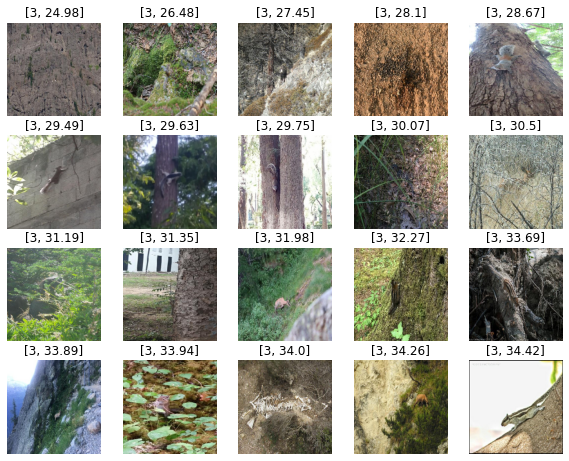

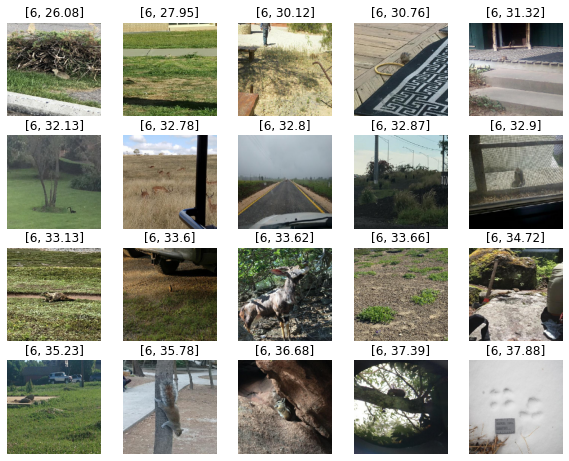

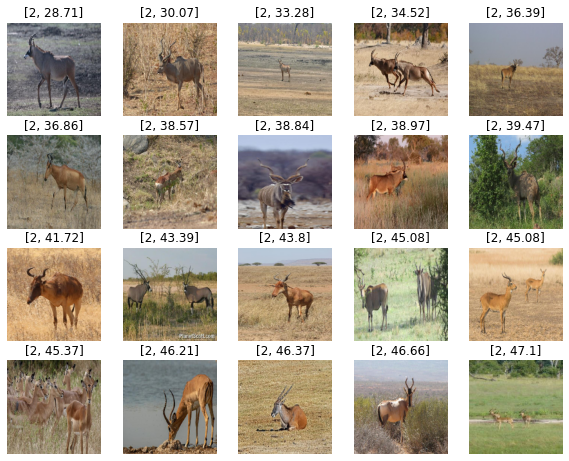

In [ ]:
#for k in groups:
for k in [3,6,2]:
  cluster_no = k
  i = 0
  j = len (groups [cluster_no]) # group [1] means cluster 1
  i_list = []
  j_list = []
  g_list = []
  g_p    = []

  for g in groups [cluster_no]: # group [1] means cluster 1
      i = i + 1
      j = j - 1

      if "blur" not  in g[0]: #g [0] is the name of the file
        i_list.append(i)
        j_list.append (j)
        g_list.append (g [1] [cluster_no]) # g[1] is the transformation distanace array [1] means dist to cluster 1
        g_p.append (g[0])
        print (i,j , g [1] [cluster_no],g[0])
      else:
        continue
  out_path = '/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/clustered_dogs_1.csv'
  #df     = pd.DataFrame (data = {"i":i_list , "g":g_list,"p":g_p,"cluster":cluster_no}).sort_values ("g")
  #pd.DataFrame (data = {"i":i_list , "g":g_list,"p":g_p,"cluster":cluster_no}).sort_values ("g").to_csv (out_path,mode='a')


  top_df = pd.DataFrame (data = {"i":i_list , "j":j_list , "g":g_list,"p":g_p}).sort_values ("g").iloc [:20,:]
  bottom_df = pd.DataFrame (data = {"i":i_list , "j":j_list , "g":g_list,"p":g_p}).sort_values ("g",ascending =False).iloc [:20,:]
  import matplotlib.pyplot as plt

  plt.figure(figsize=(10, 10))

  for i in range(20):
      img = load_img(top_df.p.values.tolist()[i], target_size=(224,224))
      print (top_df.index.tolist()[i], groups[cluster_no] [top_df.index.tolist()[i]])
      # convert from 'PIL.Image.Image' to numpy array
      #img = np.array(img)
      #ax = plt.subplot(3, 3, i + 1)
      ax = plt.subplot(5, 5 ,i+1)
      plt.imshow(np.array(img).astype("uint8"))
      plt.title([ cluster_no, round (groups[cluster_no] [top_df.index.tolist()[i]] [1] [cluster_no],2) ])
      #plt.title(cluster_no)
      plt.axis("off")




In [ ]:
cluster_no = 2
i = 0
j = len (groups [cluster_no]) # group [1] means cluster 1
i_list = []
j_list = []
g_list = []
g_p    = []

for g in groups [cluster_no]: # group [1] means cluster 1
    i = i + 1
    j = j - 1

    if "blur" not  in g[0]: #g [0] is the name of the file
      i_list.append(i)
      j_list.append (j)
      g_list.append (g [1] [cluster_no]) # g[1] is the transformation distanace array [1] means dist to cluster 1
      g_p.append (g[0])
      print (i,j , g [1] [cluster_no],g[0])
    else:
       continue

1 19 47.403203696863244 /gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Train/Sciuridae//d33f56e2-1ac7-4dcb-a982-db9d6c16767d.jpg
2 18 58.87183743744146 /gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Train/Sciuridae//e346a10b-27b0-44ea-b709-22578ea56d35.jpg
3 17 52.0471409055176 /gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Train/Sciuridae//a3db71a3-9db7-46eb-9ddf-8ea39a07f2bc.jpg
4 16 61.01090031956987 /gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Train/Sciuridae//0ff0d854-0082-4545-8358-55495807de43.jpg
5 15 45.65552839626375 /gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Train/Sciuridae//56454d39-f8d9-4ff8-9334-b7b551bc29cb.jpg
6 14 54.847658427339546 /gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Train/Sciuridae//b79c17a7-2110-47d7-8edc-93d8284f1c1a.jpg
7 13 67.57899749833167 /gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Train/Sciurida

In [ ]:
pd.DataFrame (data = {"i":i_list , "j":j_list , "g":g_list,"p":g_p}).sort_values ("g").iloc [:20,:]

,i,j,g,p
22,23,93,26.634964,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
50,51,65,27.336287,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
72,73,43,28.483084,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
65,66,50,28.930340,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
25,26,90,29.151745,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
100,101,15,29.189907,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
69,70,46,29.282402,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
103,104,12,29.312109,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
47,48,68,29.363453,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
66,67,49,29.454454,/gdrive/My Drive/Colab Notebooks/ComputerVisio...


In [ ]:
pd.DataFrame (data = {"i":i_list , "j":j_list , "g":g_list,"p":g_p}).sort_values ("g").iloc [-20:,:]

,i,j,g,p
44,45,71,44.462452,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
85,86,30,44.600788,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
13,14,102,44.613331,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
67,68,48,44.753044,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
93,94,22,44.871895,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
92,93,23,44.970676,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
49,50,66,45.327953,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
45,46,70,45.813229,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
5,6,110,46.879063,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
24,25,91,47.201771,/gdrive/My Drive/Colab Notebooks/ComputerVisio...


In [ ]:
#pd.DataFrame (data = {"i":i_list , "j":j_list , "g":g_list,"p":g_p}).sort_values ("g").to_csv ('/gdrive/MyDrive/Colab Notebooks/ComputerVision/ImageClustering/moderate_blurry_animals/x.csv',mode='a',header=False)

In [ ]:
from warnings import filterwarnings
import tensorflow as tf
from tensorflow import io
from tensorflow import image
from matplotlib import pyplot as plt


In [ ]:
groups[cluster_no] [28]

['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/location_38/cat//5991035c-23d2-11e8-a6a3-ec086b02610b.jpg',
 array([37.534344, 53.70286 ], dtype=float32)]

<dtype: 'uint8'>


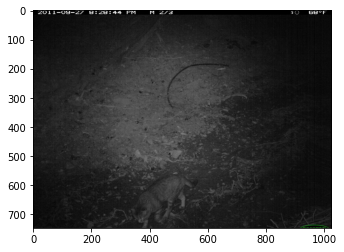

In [ ]:
filterwarnings("ignore")
#tf_img = io.read_file(groups[cluster_no][109][0])
tf_img = io.read_file(groups[cluster_no][36][0])
tf_img = image.decode_png(tf_img, channels=3)
print(tf_img.dtype)
plt.imshow(tf_img)

In [ ]:
top_df = pd.DataFrame (data = {"i":i_list , "j":j_list , "g":g_list,"p":g_p}).sort_values ("g").iloc [:20,:]
top_df.head()

,i,j,g,p
18,19,1,39.967088,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
17,18,2,42.363606,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
4,5,15,45.655528,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
12,13,7,46.441344,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
8,9,11,47.306739,/gdrive/My Drive/Colab Notebooks/ComputerVisio...


In [ ]:
bottom_df = pd.DataFrame (data = {"i":i_list , "j":j_list , "g":g_list,"p":g_p}).sort_values ("g",ascending =False).iloc [:20,:]
bottom_df.head()

,i,j,g,p
16,17,3,67.671688,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
6,7,13,67.578997,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
3,4,16,61.010900,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
1,2,18,58.871837,/gdrive/My Drive/Colab Notebooks/ComputerVisio...
15,16,4,58.759182,/gdrive/My Drive/Colab Notebooks/ComputerVisio...


In [ ]:
bottom_df.index.tolist()

[38, 33, 24, 93, 47, 54, 70, 6, 57, 18, 2, 95, 56, 83, 48, 105, 20, 34, 71, 90]

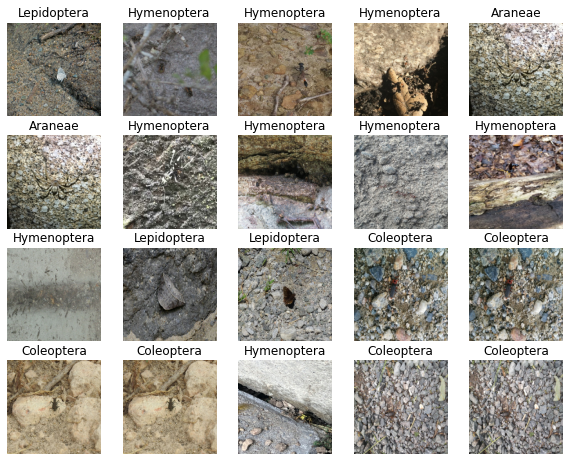

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

for i in range(20):
  img = load_img(top_df.p.values.tolist()[i], target_size=(224,224))
  #print (top_df.index.tolist()[i], groups[cluster_no] [top_df.index.tolist()[i]])
  # convert from 'PIL.Image.Image' to numpy array
  #img = np.array(img)
  #ax = plt.subplot(3, 3, i + 1)
  ax = plt.subplot(5, 5 ,i+1)
  plt.imshow(np.array(img).astype("uint8"))
  plt.title( top_df.s.tolist() [i] )
  #plt.title(groups[cluster_no] [top_df.index.tolist()[i]] [1] [cluster_no])
  plt.axis("off")

#0

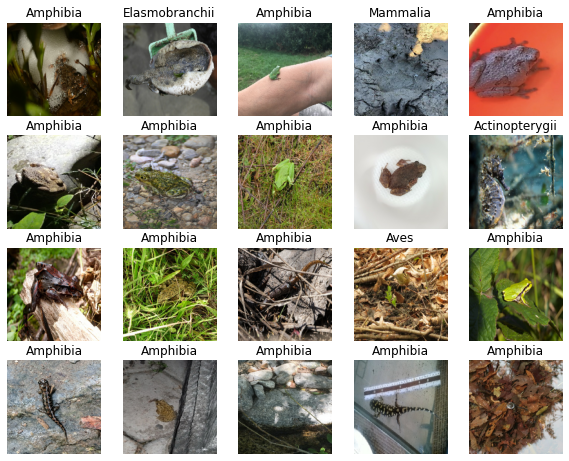

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

for i in range(20):
  img = load_img(top_df.iloc [200:220,:].p.values.tolist()[i], target_size=(224,224))
  #print (top_df.index.tolist()[i], groups[cluster_no] [top_df.index.tolist()[i]])
  # convert from 'PIL.Image.Image' to numpy array
  #img = np.array(img)
  #ax = plt.subplot(3, 3, i + 1)
  ax = plt.subplot(5, 5 ,i+1)
  plt.imshow(np.array(img).astype("uint8"))
  plt.title( top_df.iloc [200:220,:].s.tolist() [i] )
  #plt.title(groups[cluster_no] [top_df.index.tolist()[i]] [1] [cluster_no])
  plt.axis("off")

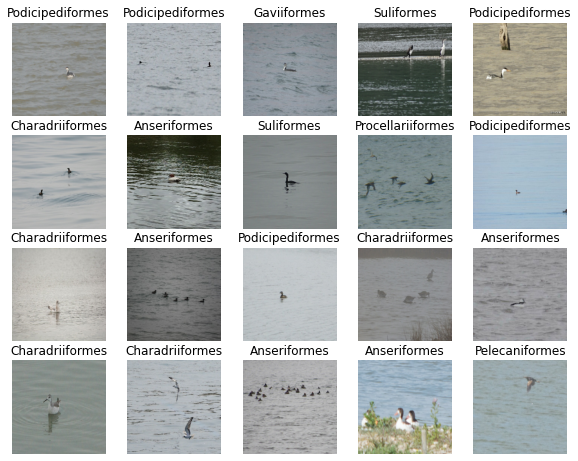

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

for i in range(20):
  img = load_img(top_df.p.values.tolist()[i], target_size=(224,224))
  #print (top_df.index.tolist()[i], groups[cluster_no] [top_df.index.tolist()[i]])
  # convert from 'PIL.Image.Image' to numpy array
  #img = np.array(img)
  #ax = plt.subplot(3, 3, i + 1)
  ax = plt.subplot(5, 5 ,i+1)
  plt.imshow(np.array(img).astype("uint8"))
  plt.title( top_df.s.tolist() [i] )
  #plt.title(groups[cluster_no] [top_df.index.tolist()[i]] [1] [cluster_no])
  plt.axis("off")

#5

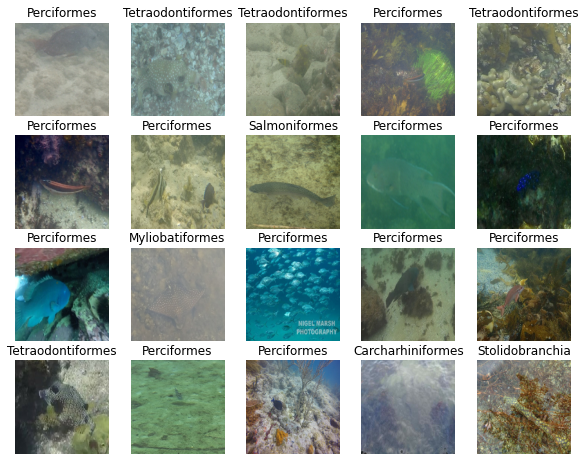

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

for i in range(20):
  img = load_img(top_df.p.values.tolist()[i], target_size=(224,224))
  #print (top_df.index.tolist()[i], groups[cluster_no] [top_df.index.tolist()[i]])
  # convert from 'PIL.Image.Image' to numpy array
  #img = np.array(img)
  #ax = plt.subplot(3, 3, i + 1)
  ax = plt.subplot(5, 5 ,i+1)
  plt.imshow(np.array(img).astype("uint8"))
  plt.title( top_df.s.tolist() [i] )
  #plt.title(groups[cluster_no] [top_df.index.tolist()[i]] [1] [cluster_no])
  plt.axis("off")

#4

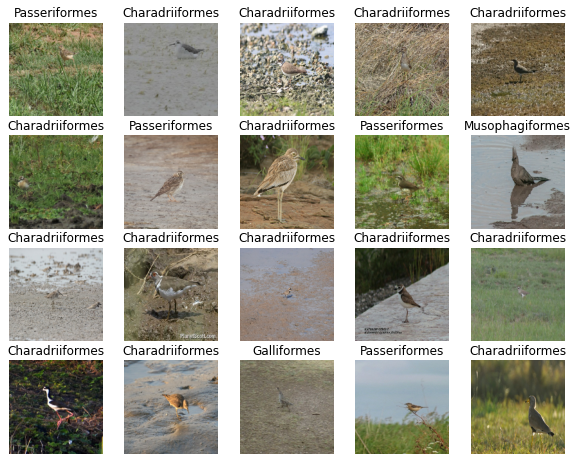

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

for i in range(20):
  img = load_img(top_df.p.values.tolist()[i], target_size=(224,224))
  #print (top_df.index.tolist()[i], groups[cluster_no] [top_df.index.tolist()[i]])
  # convert from 'PIL.Image.Image' to numpy array
  #img = np.array(img)
  #ax = plt.subplot(3, 3, i + 1)
  ax = plt.subplot(5, 5 ,i+1)
  plt.imshow(np.array(img).astype("uint8"))
  plt.title( top_df.s.tolist() [i] )
  #plt.title(groups[cluster_no] [top_df.index.tolist()[i]] [1] [cluster_no])
  plt.axis("off")

#8

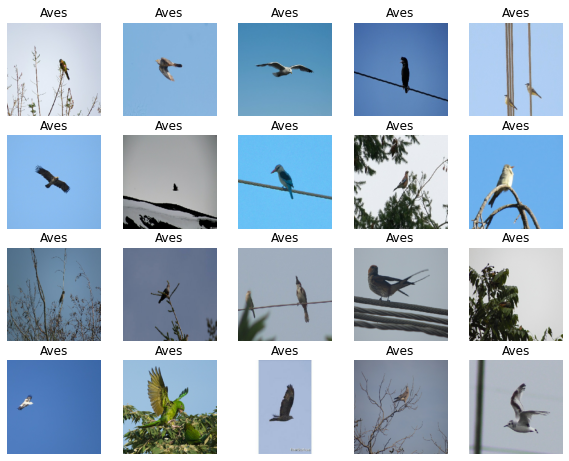

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

for i in range(20):
  img = load_img(top_df.iloc[500:520,:].p.values.tolist()[i], target_size=(224,224))
  #print (top_df.index.tolist()[i], groups[cluster_no] [top_df.index.tolist()[i]])
  # convert from 'PIL.Image.Image' to numpy array
  #img = np.array(img)
  #ax = plt.subplot(3, 3, i + 1)
  ax = plt.subplot(5, 5 ,i+1)
  plt.imshow(np.array(img).astype("uint8"))
  #plt.title( top_df.iloc[300:320,:].s.tolist() [i] )
  plt.title( "Aves" )
  #plt.title(groups[cluster_no] [top_df.index.tolist()[i]] [1] [cluster_no])
  plt.axis("off")

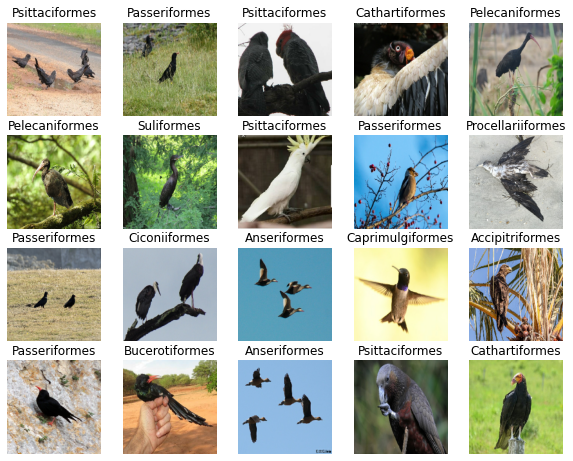

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

for i in range(20):
  img = load_img(top_df.iloc[-40:-20,:].p.values.tolist()[i], target_size=(224,224))
  #print (top_df.index.tolist()[i], groups[cluster_no] [top_df.index.tolist()[i]])
  # convert from 'PIL.Image.Image' to numpy array
  #img = np.array(img)
  #ax = plt.subplot(3, 3, i + 1)
  ax = plt.subplot(5, 5 ,i+1)
  plt.imshow(np.array(img).astype("uint8"))
  plt.title( top_df.iloc[-40:-20,:].s.tolist() [i] )
  #plt.title(groups[cluster_no] [top_df.index.tolist()[i]] [1] [cluster_no])
  plt.axis("off")

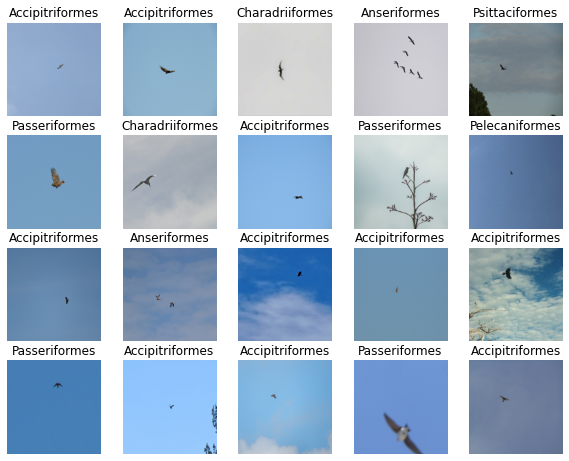

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

for i in range(20):
  img = load_img(top_df.iloc[40:60,:].p.values.tolist()[i], target_size=(224,224))
  #print (top_df.index.tolist()[i], groups[cluster_no] [top_df.index.tolist()[i]])
  # convert from 'PIL.Image.Image' to numpy array
  #img = np.array(img)
  #ax = plt.subplot(3, 3, i + 1)
  ax = plt.subplot(5, 5 ,i+1)
  plt.imshow(np.array(img).astype("uint8"))
  plt.title( top_df.iloc[40:60,:].s.tolist() [i] )
  #plt.title(groups[cluster_no] [top_df.index.tolist()[i]] [1] [cluster_no])
  plt.axis("off")

#7

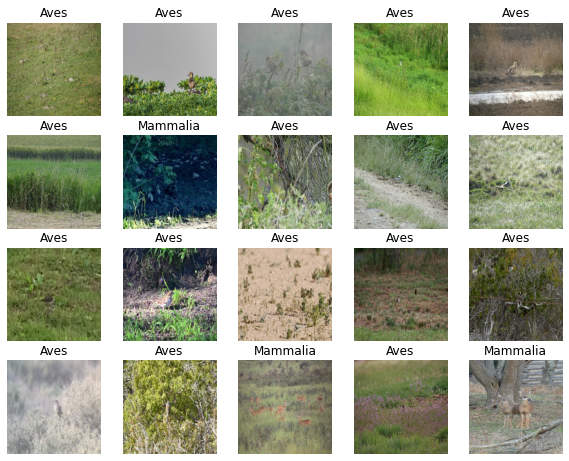

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

for i in range(20):
  img = load_img(top_df.iloc[40:60,:].p.values.tolist()[i], target_size=(224,224))
  #print (top_df.index.tolist()[i], groups[cluster_no] [top_df.index.tolist()[i]])
  # convert from 'PIL.Image.Image' to numpy array
  #img = np.array(img)
  #ax = plt.subplot(3, 3, i + 1)
  ax = plt.subplot(5, 5 ,i+1)
  plt.imshow(np.array(img).astype("uint8"))
  plt.title( top_df.iloc[40:60,:].s.tolist() [i] )
  #plt.title(groups[cluster_no] [top_df.index.tolist()[i]] [1] [cluster_no])
  plt.axis("off")

#6

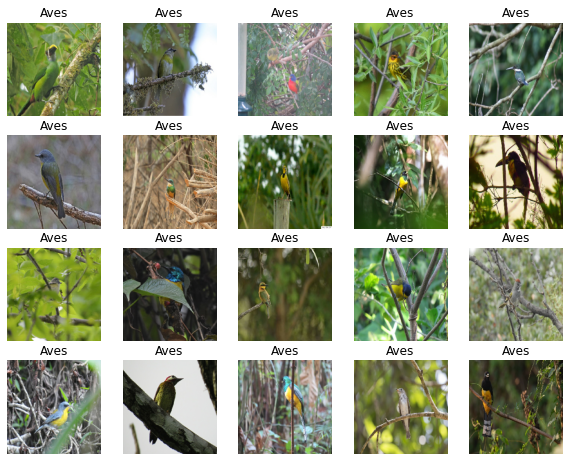

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

for i in range(20):
  img = load_img(top_df.p.values.tolist()[i], target_size=(224,224))
  #print (top_df.index.tolist()[i], groups[cluster_no] [top_df.index.tolist()[i]])
  # convert from 'PIL.Image.Image' to numpy array
  #img = np.array(img)
  #ax = plt.subplot(3, 3, i + 1)
  ax = plt.subplot(5, 5 ,i+1)
  plt.imshow(np.array(img).astype("uint8"))
  plt.title( top_df.s.tolist() [i] )
  #plt.title(groups[cluster_no] [top_df.index.tolist()[i]] [1] [cluster_no])
  plt.axis("off")

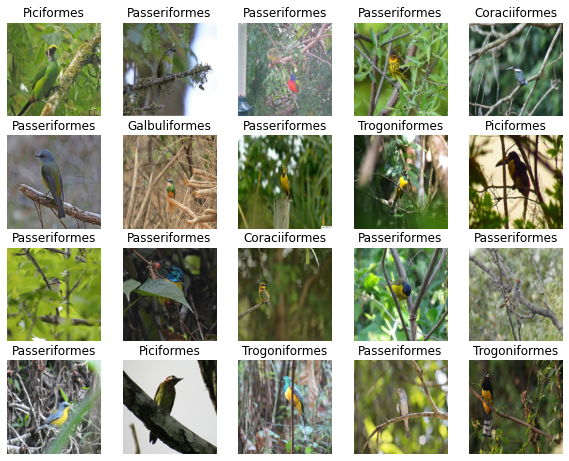

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

for i in range(20):
  img = load_img(top_df.p.values.tolist()[i], target_size=(224,224))
  #print (top_df.index.tolist()[i], groups[cluster_no] [top_df.index.tolist()[i]])
  # convert from 'PIL.Image.Image' to numpy array
  #img = np.array(img)
  #ax = plt.subplot(3, 3, i + 1)
  ax = plt.subplot(5, 5 ,i+1)
  plt.imshow(np.array(img).astype("uint8"))
  plt.title( top_df.s.tolist() [i] )
  #plt.title(groups[cluster_no] [top_df.index.tolist()[i]] [1] [cluster_no])
  plt.axis("off")

18 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Train/Sciuridae//82eba695-8330-45f2-ba19-0ae5a5a6b2d8.jpg', array([58.3822262 , 66.92842347, 39.96708785, 74.72082271, 69.42459615,
       57.47282572])]
17 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Train/Sciuridae//f3e6e338-a79d-4d7e-b90a-fc31734dfed4.jpg', array([65.1012122 , 81.62452034, 42.36360567, 89.69709981, 83.70481311,
       70.81957346])]
4 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Train/Sciuridae//56454d39-f8d9-4ff8-9334-b7b551bc29cb.jpg', array([50.63610636, 57.43354403, 45.6555284 , 68.64862004, 59.44301919,
       52.22956983])]
12 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Train/Sciuridae//f2ba57d0-dc2f-41f1-b556-a9202229e54d.jpg', array([59.52104857, 80.88796488, 46.44134385, 87.16925981, 81.7963319 ,
       68.1330376 ])]
8 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Train/Sciuridae//da7c

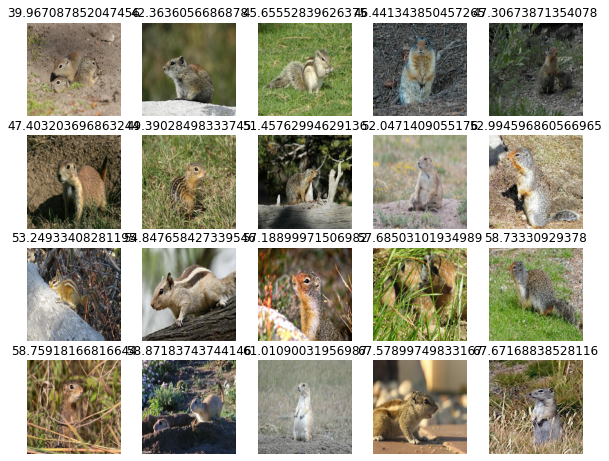

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

for i in range(20):
  img = load_img(top_df.p.values.tolist()[i], target_size=(224,224))
  print (top_df.index.tolist()[i], groups[cluster_no] [top_df.index.tolist()[i]])
  # convert from 'PIL.Image.Image' to numpy array
  #img = np.array(img)
  #ax = plt.subplot(3, 3, i + 1)
  ax = plt.subplot(5, 5 ,i+1)
  plt.imshow(np.array(img).astype("uint8"))
  plt.title(groups[cluster_no] [top_df.index.tolist()[i]] [1] [cluster_no])
  plt.axis("off")

16 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Train/Sciuridae//f85ddf51-ec20-4020-8d1c-7a1c6774eeb6.jpg', array([80.49595836, 78.41700061, 67.67168839, 89.09078244, 81.40390614,
       71.23839595])]
6 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Train/Sciuridae//d5892f36-9fde-45f9-ab12-3599bc47be9f.jpg', array([68.62856542, 79.35720248, 67.5789975 , 88.79037955, 85.50322562,
       81.38669928])]
3 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Train/Sciuridae//0ff0d854-0082-4545-8358-55495807de43.jpg', array([78.08798854, 71.54068626, 61.01090032, 82.62138456, 75.00052872,
       62.41836064])]
1 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Train/Sciuridae//e346a10b-27b0-44ea-b709-22578ea56d35.jpg', array([74.51237561, 75.50829561, 58.87183744, 80.69111884, 77.70791836,
       61.35342123])]
15 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/OOD_Train/Sciuridae//1863c

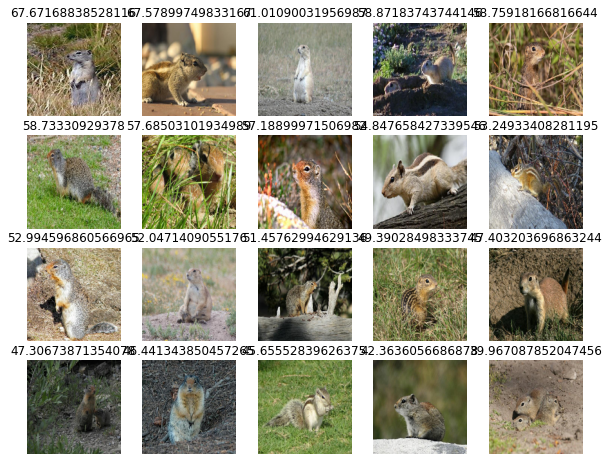

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

for i in range(20):
  img = load_img(bottom_df.p.values.tolist()[i], target_size=(224,224))
  print (bottom_df.index.tolist()[i], groups[cluster_no] [bottom_df.index.tolist()[i]])
  # convert from 'PIL.Image.Image' to numpy array
  #img = np.array(img)
  #ax = plt.subplot(3, 3, i + 1)
  ax = plt.subplot(5, 5,i+1)
  plt.imshow(np.array(img).astype("uint8"))
  plt.title(groups[cluster_no] [bottom_df.index.tolist()[i]] [1] [cluster_no])
  plt.axis("off")

47 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/location_100/dog//590a0e71-23d2-11e8-a6a3-ec086b02610b.jpg', array([63.577316, 56.87158 , 63.046947, 27.958164, 70.27176 , 72.62777 ],
      dtype=float32)]
100 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/location_100/dog//58d16173-23d2-11e8-a6a3-ec086b02610b.jpg', array([53.881386, 42.783806, 52.44961 , 29.108194, 64.131096, 63.17056 ],
      dtype=float32)]
105 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/location_100/dog//5911d9c6-23d2-11e8-a6a3-ec086b02610b.jpg', array([63.166943, 51.324554, 59.861187, 29.74632 , 71.371376, 71.55036 ],
      dtype=float32)]
129 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/location_100/dog//589e68ff-23d2-11e8-a6a3-ec086b02610b.jpg', array([68.102066, 59.168423, 61.063953, 30.370499, 72.52539 , 76.99805 ],
      dtype=float32)]
75 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/location_100/dog//588dbb

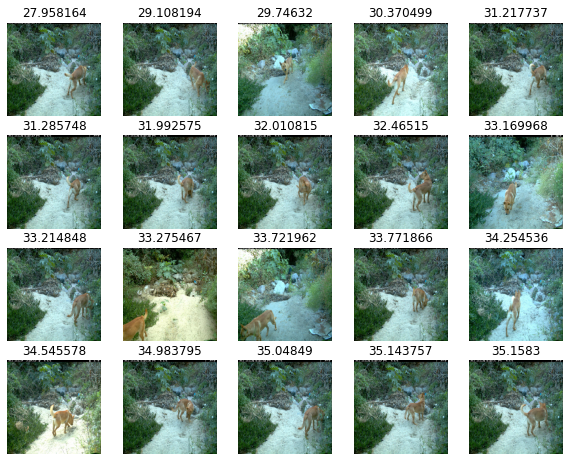

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

for i in range(20):
  img = load_img(top_df.p.values.tolist()[i], target_size=(224,224))
  print (top_df.index.tolist()[i], groups[cluster_no] [top_df.index.tolist()[i]])
  # convert from 'PIL.Image.Image' to numpy array
  #img = np.array(img)
  #ax = plt.subplot(3, 3, i + 1)
  ax = plt.subplot(5, 5 ,i+1)
  plt.imshow(np.array(img).astype("uint8"))
  plt.title(groups[cluster_no] [top_df.index.tolist()[i]] [1] [cluster_no])
  plt.axis("off")

68 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/location_100/dog//58e599c0-23d2-11e8-a6a3-ec086b02610b.jpg', array([ 94.88599 ,  86.24252 ,  92.73722 ,  61.21617 ,  96.119095,
       102.6018  ], dtype=float32)]
10 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/location_100/dog//59180af0-23d2-11e8-a6a3-ec086b02610b.jpg', array([ 96.22471 ,  91.49755 ,  92.64967 ,  61.158035,  96.59593 ,
       102.96559 ], dtype=float32)]
122 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/location_100/dog//5897b2ef-23d2-11e8-a6a3-ec086b02610b.jpg', array([82.224655, 71.84848 , 75.57779 , 59.273964, 88.13482 , 90.39685 ],
      dtype=float32)]
109 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/location_100/dog//58d2ec4c-23d2-11e8-a6a3-ec086b02610b.jpg', array([90.80295 , 84.26685 , 90.499695, 58.607323, 92.546646, 97.21253 ],
      dtype=float32)]
0 ['/gdrive/My Drive/Colab Notebooks/ComputerVision/ImageClassifier/location_38/

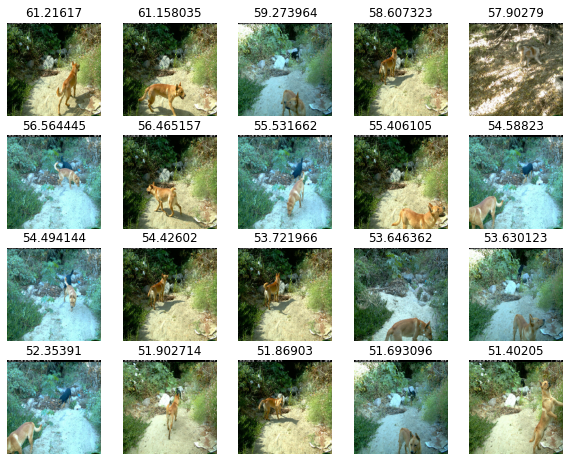

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

for i in range(20):
  img = load_img(bottom_df.p.values.tolist()[i], target_size=(224,224))
  print (bottom_df.index.tolist()[i], groups[cluster_no] [bottom_df.index.tolist()[i]])
  # convert from 'PIL.Image.Image' to numpy array
  #img = np.array(img)
  #ax = plt.subplot(3, 3, i + 1)
  ax = plt.subplot(5, 5,i+1)
  plt.imshow(np.array(img).astype("uint8"))
  plt.title(groups[cluster_no] [bottom_df.index.tolist()[i]] [1] [cluster_no])
  plt.axis("off")